# Flight Data Wrangling and Visualization

#### March, 24th, 2019, by Yayin Cai

As a traveler, it's a great opportunity to have a closer look at the flight data and visualize some interesting facts. The analysis is mainly focused on the United States.

## 1. Data Extraction

### 1.1. Importing Tabular Data

In [2]:
# csv is a package for file reading/IO
import csv

# pandas and numpy are the data analysis libraries
import pandas as pd
import numpy as np

The first 3 files are from [OpenFlights](http://openflights.org/data.html).  Other data is available [here](http://jblevins.org/notes/airline-data).

### airports.dat.txt
As of January 2012, the OpenFlights Airports Database contains 6977 airports spanning the globe, as shown in the map above. Each entry contains the following information:

1. `Airport ID`	Unique OpenFlights identifier for this airport.
2. `Name`	Name of airport. May or may not contain the City name.
3. `City`	Main city served by airport. May be spelled differently from Name.
4. `Country`	Country or territory where airport is located.
5. `IATA`/FAA	3-letter FAA code, for airports located in Country "United States of America". 3-letter IATA code, for all other airports. Blank if not assigned.
6. `ICAO`	4-letter ICAO code. Blank if not assigned.
7. `Lat`	Latitude in decimal degrees, usually to six significant digits. Negative is South, positive is North.
8. `Lon`	Longitude in decimal degrees, usually to six significant digits. Negative is West, positive is East.
9. `Alt`	Altitude in feet.
11. `Timezone`	Hours offset from UTC. Fractional hours are expressed as decimals, eg. India is 5.5.
12. `DST`	Daylight savings time. One of E (Europe), A (US/Canada), S (South America), O (Australia), Z (New Zealand), N (None) or U (Unknown). See also: Help: Time
13. `Tz` database time zone	Timezone in "tz" (Olson) format, eg. "America/Los_Angeles".

The data is ISO 8859-1 (Latin-1) encoded, with no special characters.

**Note: Rules for daylight savings time change from year to year and from country to country. The current data is an approximation for 2009, built on a country level. Most airports in DST-less regions in countries that generally observe DST (eg. AL, HI in the USA, NT, QL in Australia, parts of Canada) are marked incorrectly.**

In [86]:
airports_df = pd.read_table("airports.dat.txt", header = None, sep = ",", names = ["airport_id","airport_name","airport_city",
                                                                      "airport_country","airport_iata","airport_icao",
                                                                      "lat","lon","alt","timezone","dst","tz"])

In [87]:
airports_df.head()

,airport_id,airport_name,airport_city,airport_country,airport_iata,airport_icao,lat,lon,alt,timezone,dst,tz
0,1,Goroka,Goroka,Papua New Guinea,GKA,AYGA,-6.081689,145.391881,5282,10.0,U,Pacific/Port_Moresby
1,2,Madang,Madang,Papua New Guinea,MAG,AYMD,-5.207083,145.788700,20,10.0,U,Pacific/Port_Moresby
2,3,Mount Hagen,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789,144.295861,5388,10.0,U,Pacific/Port_Moresby
3,4,Nadzab,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569828,146.726242,239,10.0,U,Pacific/Port_Moresby
4,5,Port Moresby Jacksons Intl,Port Moresby,Papua New Guinea,POM,AYPY,-9.443383,147.220050,146,10.0,U,Pacific/Port_Moresby


### airlines.dat.txt
As of January 2012, the OpenFlights Airlines Database contains 5888 airlines. Each entry contains the following information:

1. `Airline ID`	Unique OpenFlights identifier for this airline.
2. `Name`	Name of the airline.
3. `Alias`	Alias of the airline. For example, All Nippon Airways is commonly known as "ANA".
4. `IATA`	2-letter IATA code, if available.
5. `ICAO`	3-letter ICAO code, if available.
6. `Airline Callsign`	Airline callsign.
7. `Country`	Country or territory where airline is incorporated.
8. `Active`	"Y" if the airline is or has until recently been operational, "N" if it is defunct. This field is not reliable: in particular, major airlines that stopped flying long ago, but have not had their IATA code reassigned (eg. Ansett/AN), will incorrectly show as "Y".

**The data is ISO 8859-1 (Latin-1) encoded. The special value \N is used for "NULL" to indicate that no value is available, and is understood automatically by MySQL if imported. **

In [88]:
airlines_df = pd.read_table("airlines.dat.txt", header = None, sep = ",", names = ["airline_id","airline_name","airline_alias",
                                                                                  "airline_iata","airline_icao","airline_callsign","airline_country","active"])

In [89]:
airlines_df.head()

,airline_id,airline_name,airline_alias,airline_iata,airline_icao,airline_callsign,airline_country,active
0,1,Private flight,\N,-,NaN,NaN,NaN,Y
1,2,135 Airways,\N,NaN,GNL,GENERAL,United States,N
2,3,1Time Airline,\N,1T,RNX,NEXTIME,South Africa,Y
3,4,2 Sqn No 1 Elementary Flying Training School,\N,NaN,WYT,NaN,United Kingdom,N
4,5,213 Flight Unit,\N,NaN,TFU,NaN,Russia,N


### routes.dat.txt
As of January 2012, the OpenFlights/Airline Route Mapper Route Database contains 59036 routes between 3209 airports on 531 airlines spanning the globe. Each entry contains the following information:

1. `Airline`	2-letter (IATA) or 3-letter (ICAO) code of the airline.
2. `Airline ID`	Unique OpenFlights identifier for airline (see Airline).
3. `Source airport`	3-letter (IATA) or 4-letter (ICAO) code of the source airport.
4. `Source airport ID`	Unique OpenFlights identifier for source airport (see Airport)
5. `Destination airport`	3-letter (IATA) or 4-letter (ICAO) code of the destination airport.
6. `Destination airport ID`	Unique OpenFlights identifier for destination airport (see Airport)
7. `Code_share`	"Y" if this flight is a codeshare (that is, not operated by Airline, but another carrier), empty otherwise.
8. `Stops`	Number of stops on this flight ("0" for direct)
9. `Equipment`	3-letter codes for plane type(s) generally used on this flight, separated by spaces

**The data is ISO 8859-1 (Latin-1) encoded. The special value \N is used for "NULL" to indicate that no value is available, and is understood automatically by MySQL if imported. **

In [90]:
routes_df = pd.read_table("routes.dat.txt", header = None, sep = ",", names = ["airline_iata_icao", "airline_id", "origin",
                                                                              "origin_id", "dest", "dest_id", "code_share",
                                                                              'steps',"equipment"])

In [91]:
routes_df.head()

,airline_iata_icao,airline_id,origin,origin_id,dest,dest_id,code_share,steps,equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


### On_time_On_Time_Performance_2016_10.csv (flights data)
​
The last file, `On_time_On_Time_Performance_2016_10.csv` is about flight on-time performance for October 2016. It was downloaded from [Transtats](http://www.transtats.bts.gov/) and its details are documented in readme.html. Each entry contains the following information:
​
1. `YEAR`   
2. `MONTH`  
3. `DAY_OF_MONTH`   
4. `AIRLINE_ID` (which we will not use)
5. `CARRIER`    2-letter (IATA) code of the airline
6. `FL_NUM` 
7. `ORIGIN` Source airport 3-letter (IATA)  
8. `DEST`   Destination airport 3-letter (IATA) 
9. `ARR_DELAY_NEW`  
10. `CANCELLED`

In [92]:
import requests
from io import StringIO

remote = requests.get('https://docs.google.com/uc?export=download&id=1PPtjGx8lr_cDUfVa3qwlk1W8yY6hY91n').content

In [93]:
flights_df = pd.read_csv(StringIO(remote.decode('utf-8')))

In [94]:
flights_df = flights_df.iloc[:,:-1]

In [95]:
flights_df.columns = ["year","month","day_of_month","airline_id","carrier",
                     "fl_num","origin","dest", "arr_delay_new","cancelled"]

In [96]:
flights_df.head()

,year,month,day_of_month,airline_id,carrier,fl_num,origin,dest,arr_delay_new,cancelled
0,2018,1,2,19393,WN,1325,SJU,MCO,0.0,0.0
1,2018,1,2,19393,WN,5159,SJU,MCO,0.0,0.0
2,2018,1,2,19393,WN,5890,SJU,MCO,9.0,0.0
3,2018,1,2,19393,WN,6618,SJU,MCO,0.0,0.0
4,2018,1,2,19393,WN,1701,SJU,MDW,8.0,0.0


### 1.2. Importing Text Data

To get indicents information, we can scrape data from the aircraft_incidents.htm webpage

In [97]:
from bs4 import BeautifulSoup
input_html = "aircraft_incidents.htm"

# Open file I/O
with open(input_html, "r") as ifile:
    soup = BeautifulSoup(ifile, 'html.parser')

## 2. Data Cleaning

Now we need to do some further cleaning to both the tabular and text data.

### 2.1. Cleaning Tabular Data

We are going to clean the airlines_df, airports_df, and routes_df DataFrames. 

In [98]:
# Given the parameter value `\N` it returns `NaN`, 
# otherwise it returns the value of the parameter.
def nullify(cell):
    if type(cell) == str:
        if cell.find("\\N") > -1:
            return np.nan
        else:
            return cell
    else:
        return cell

In [99]:
# Replace NaNs with blanks if the column is a string
# Everything should be of a consistent type
def fillna_col(series):
    if series.dtype is pd.np.dtype(object):
        return series.fillna('')
    else:
        return series

Next, we’ll need to use two functions to apply `nullify` and `fillna_col` to our DataFrames.  

We can apply nullify to all of the elements in each of our DataFrames (airports, airlines, etc.) and get rid of all of the “\N”s.

Also, let’s use that to call `fillna_col `on the DataFrames -- replacing the NaNs with blank strings if the column is otherwise an object.

Additionally, we want to get rid of rows in `routes_df` that have null airline, source, or destination IDs.

In [100]:
#Drop NAs in airlines_df and airports_df
airlines_df = airlines_df.applymap(nullify)
airlines_df = airlines_df.apply(fillna_col, axis=1)

airports_df = airports_df.applymap(nullify)
airports_df = airports_df.apply(fillna_col, axis=1)

In [101]:
#Have a look at the NAs in routes_df
print("The number of missing values for each column:")
for i in routes_df.columns:
    print(i, " ", str(routes_df[i].isnull().sum()))

The number of missing values for each column:
airline_iata_icao   0
airline_id   0
origin   0
origin_id   0
dest   0
dest_id   0
code_share   53066
steps   0
equipment   18


We have not seen NAs in airline, origin and dest info.

In [102]:
routes_df["code_share"].unique()

array([nan, 'Y'], dtype=object)

In [103]:
routes_df["equipment"].unique()

array(['CR2', 'A81', 'AN4', ..., '737 777 320', '330 747 777 737',
       'BE1 BEH'], dtype=object)

In [104]:
routes_df["code_share"] = routes_df["code_share"].fillna("N")
routes_df["equipment"] = routes_df["equipment"].fillna("Unknown")

In [105]:
#Check the results
if airports_df.isnull().sum().sum() != 0:
    raise ValueError('airports_df still has NaNs')
    
if airlines_df.isnull().sum().sum() != 0:
    raise ValueError('airlines_df still has Nans')
    
if routes_df.isnull().sum().sum() != 0:
    raise ValueError('routes_df still has Nans')

### 2.2. Cleaning Text Data

To clean the raw text data, we want to get rid of all `h3` and `li`, with only text in the dataset.   

Also, we want to make sure that we only keep the years and the incidents in the dataset, without extra info.  

We notice that all year infomation ends with "[edit]", and we can find the month information as well as a "-" in the incident descriptions. 

In [106]:
# Clean the text data using above assumptions

months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November",
        "December"]
incidents_clean = []

def find_month(string):
    for month in months:
        if string.find(month)>-1:
            return True
    return False

for info in soup.find_all(["h3","li"]):   
    if ("[edit]" in info.text):
        year = info.text.replace("[edit]", "")
        print("Cleaning the incidents data in " + year)
    else:
        if find_month(info.text) & ("–" in info.text):
            incident = year + " " + info.text
            incidents_clean.append(incident)
            

Cleaning the incidents data in 1919
Cleaning the incidents data in 1920
Cleaning the incidents data in 1922
Cleaning the incidents data in 1923
Cleaning the incidents data in 1924
Cleaning the incidents data in 1926
Cleaning the incidents data in 1927
Cleaning the incidents data in 1928
Cleaning the incidents data in 1929
Cleaning the incidents data in 1930
Cleaning the incidents data in 1931
Cleaning the incidents data in 1933
Cleaning the incidents data in 1934
Cleaning the incidents data in 1935
Cleaning the incidents data in 1936
Cleaning the incidents data in 1937
Cleaning the incidents data in 1938
Cleaning the incidents data in 1939
Cleaning the incidents data in 1940
Cleaning the incidents data in 1941
Cleaning the incidents data in 1942
Cleaning the incidents data in 1943
Cleaning the incidents data in 1944
Cleaning the incidents data in 1945
Cleaning the incidents data in 1946
Cleaning the incidents data in 1947
Cleaning the incidents data in 1948
Cleaning the incidents data 

In [107]:
incidents_clean[:5]

['1919 July 21 – The Goodyear dirigible Wingfoot Air Express catches fire and crashes into the Illinois Trust and Savings Building in Chicago, Illinois, while carrying passengers to a local amusement park, killing thirteen people: three out of the five on board and ten others on the ground, with 27 others on the ground being injured.',
 '1919 August 2 – A Caproni Ca.48 crashes at Verona, Italy, during a flight from Venice to Taliedo, Milan, killing all on board (14, 15, or 17 people, according to different sources).',
 '1920 December 14 – A Handley Page Transport Handley Page O/400 hits a tree and crashes at Golders Green, London, after failing to gain height following takeoff, killing four out of eight on board.',
 '1922 April 7 – In the first mid-air collision of airliners, a de Havilland DH.18A, G-EAWO, operated by Daimler Hire Ltd., collides with a Farman F.60 Goliath, F-GEAD, operated by Compagnie des Grands Express Aériens (CGEA), over the Thieulloy-St. Antoine road near Picardie

In [108]:
incidents_clean[-5:]

['2017 September 30 – Air France Flight 66, an Airbus A380, suffers an uncontained engine failure and makes an emergency landing at Goose Bay Airport, Canada. No one is killed or injured.',
 "2017 October 14 – In the 2017 Valan International Antonov An-26 crash, an Antonov An-26 crashes into the sea just short of Abidjan's Félix Houphouët Boigny International Airport, Ivory Coast. Four of the ten occupants are killed.",
 '2017 December 13 – West Wind Aviation Flight 280, an ATR 42-300, crashes shortly after takeoff from Fond-du-Lac Airport, Saskatchewan, Canada. Of the 25 passengers and crew on board, all initially survive, but one passenger dies of his injuries in the hospital 12 days later.',
 '2017 December 31 – In the 2017 Nature Air Cessna 208 Caravan crash, a Cessna 208 Caravan crashes shortly after takeoff from Punta Islita Airport, Costa Rica. All 12 passengers and crew on board are killed.',
 '2018 January 13 – Pegasus Airlines Flight 8622, a Boeing 737-800 skids off the end o

We want to create `incidents_df` to store the incidents data

In [109]:
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords

In [110]:
stop_words = set(stopwords.words('english')) 
steop_words_cap = [word.capitalize() for word in stop_words]

def remove_stop(sentence):
    word_tokens = word_tokenize(sentence) 
    filtered_sentence = " ".join([w for w in word_tokens if (not w in stop_words) and (not w in steop_words_cap)])
    return filtered_sentence

In [111]:
def find_airline(raw_list):
    airline = []
    for word in raw_list:
        if word.startswith("Air"):
            for i in range(raw_list.index(word),-1,-1):
                if raw_list[i] == raw_list[i].capitalize():
                    airline.insert(0,raw_list[i])
                else:
                    break
    return airline

In [112]:
incidents_list = []

for incident in incidents_clean:
    incident = remove_stop(incident)
    incident_record = []
    date_all = incident.split(" – ")[0].split(" ")
    year = date_all[0]
    month = date_all[1]
    day = date_all[2]
  
    if ("Flight" in incident) & (len(year)==4) & (month in months) & (len(day)<2):
        incident_record.append(" ".join(date_all))
        incident_record.append(year)
        incident_record.append(month)
        incident_record.append(day)
        
        flight_index = incident.split(" – ")[1].split(" ").index("Flight")
        airline_info = incident.split(" – ")[1].split(" ")[:flight_index]
        
        if "," in airline_info:
            airline_info = airline_info[airline_info.index(",")+1:]
        if ";" in airline_info:
            airline_info = airline_info[airline_info.index(";")+1:]
        if ":" in airline_info:
            airline_info = airline_info[airline_info.index(":")+1:]
        if len(airline_info)>5:
            airline_info = find_airline(airline_info)
            
        airline_info = " ".join(airline_info)
        flight_num = "".join(incident.split(" – ")[1].split(" ")[flight_index+1:flight_index+2]).replace(" ","")
        
        incident_record.append(airline_info)
        incident_record.append(flight_num)
        incidents_list.append(incident_record)
    
incidents_df = pd.DataFrame(incidents_list,columns = ["date","year","month","day","airline","fl_num"])        

In [113]:
incidents_df.head()

,date,year,month,day,airline,fl_num
0,1936 April 7,1936,April,7,TWA,1
1,1936 August 5,1936,August,5,Chicago Southern,4
2,1943 June 1,1943,June,1,BOAC,777
3,1945 January 8,1945,January,8,,161
4,1945 October 5,1945,October,5,National Airlines,16


In [114]:
incidents_df["date"] = pd.to_datetime(incidents_df["date"])

### 2.3.  Exporting Data

Now, we can export data into database to make them "persistent".

In [3]:
import sqlite3
engine = sqlite3.connect('flight_db')

In [118]:
airlines_df.to_sql('airlines', engine, if_exists='replace',index = False) 
airports_df.to_sql('airports', engine, if_exists='replace',index = False) 
flights_df.to_sql('flights', engine, if_exists='replace',index = False) 
routes_df.to_sql('routes', engine, if_exists='replace',index = False)
incidents_df.to_sql("incidents", engine, if_exists = 'replace', index = False)

## 3.  Exploratory Analysis and Data Visualization

Now, we want to check if we can read tables from the database.

In [119]:
airlines_df2 = pd.read_sql_query('select * from airlines', engine)
airports_df2 = pd.read_sql_query('select * from airports', engine)
flights_df2 = pd.read_sql_query('select * from flights', engine)
routes_df2 = pd.read_sql_query('select * from routes', engine)
incidents_df2 = pd.read_sql_query('select * from incidents', engine)

In [236]:
airlines_df2.head()

,airline_id,airline_name,airline_alias,airline_iata,airline_icao,airline_callsign,airline_country,active
0,1,Private flight,,-,,,,Y
1,2,135 Airways,,,GNL,GENERAL,United States,N
2,3,1Time Airline,,1T,RNX,NEXTIME,South Africa,Y
3,4,2 Sqn No 1 Elementary Flying Training School,,,WYT,,United Kingdom,N
4,5,213 Flight Unit,,,TFU,,Russia,N


In [237]:
airports_df2.head()

,airport_id,airport_name,airport_city,airport_country,airport_iata,airport_icao,lat,lon,alt,timezone,dst,tz
0,1,Goroka,Goroka,Papua New Guinea,GKA,AYGA,-6.081689,145.391881,5282,10.0,U,Pacific/Port_Moresby
1,2,Madang,Madang,Papua New Guinea,MAG,AYMD,-5.207083,145.788700,20,10.0,U,Pacific/Port_Moresby
2,3,Mount Hagen,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789,144.295861,5388,10.0,U,Pacific/Port_Moresby
3,4,Nadzab,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569828,146.726242,239,10.0,U,Pacific/Port_Moresby
4,5,Port Moresby Jacksons Intl,Port Moresby,Papua New Guinea,POM,AYPY,-9.443383,147.220050,146,10.0,U,Pacific/Port_Moresby


In [238]:
flights_df2.head()

,year,month,day_of_month,airline_id,carrier,fl_num,origin,dest,arr_delay_new,cancelled
0,2018,1,2,19393,WN,1325,SJU,MCO,0.0,0.0
1,2018,1,2,19393,WN,5159,SJU,MCO,0.0,0.0
2,2018,1,2,19393,WN,5890,SJU,MCO,9.0,0.0
3,2018,1,2,19393,WN,6618,SJU,MCO,0.0,0.0
4,2018,1,2,19393,WN,1701,SJU,MDW,8.0,0.0


In [239]:
routes_df2.head()

,airline_iata_icao,airline_id,origin,origin_id,dest,dest_id,code_share,steps,equipment
0,2B,410,AER,2965,KZN,2990,N,0,CR2
1,2B,410,ASF,2966,KZN,2990,N,0,CR2
2,2B,410,ASF,2966,MRV,2962,N,0,CR2
3,2B,410,CEK,2968,KZN,2990,N,0,CR2
4,2B,410,CEK,2968,OVB,4078,N,0,CR2


In [240]:
incidents_df2.head()

,date,year,month,day,airline,fl_num
0,1936-04-07,1936,April,7,TWA,1
1,1936-08-05,1936,August,5,Chicago Southern,4
2,1943-06-01,1943,June,1,BOAC,777
3,1945-01-08,1945,January,8,,161
4,1945-10-05,1945,October,5,National Airlines,16


It shows that all tables are stored in the database and we can read them. Next, we want to do some data wrangling and visualization.

## 3.1. Understandng Flight Routes Information

First, we would like to explore the flight route dataset `routes_df2`.

### 3.1.1. Busy Airports

Now let's understand more about the really busy airports in `routes_df2`. We want to have a look at the number of flights out of each source airport, restricted to those with more than 100 such flights.

In [448]:
busy_origin = routes_df2.groupby("origin").size().reset_index(name="count").query("count>100").sort_values("count", ascending = False)
print("There are",str(len(busy_origin)),"airports with more than 100 flight routes for departure.")
print("The top 10 busy source airports are:", busy_origin[:10]["origin"].unique())


There are 162 airports with more than 100 flight routes for departure.
The top 10 busy source airports are: ['ATL' 'ORD' 'PEK' 'LHR' 'CDG' 'FRA' 'LAX' 'DFW' 'JFK' 'AMS']


In [457]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style = "white")

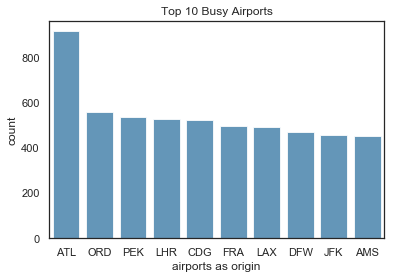

In [468]:
ax = sns.barplot(x = "origin", y = "count", data = busy_origin[:10], 
                 ci=None, color = "#2c7fb8",alpha = 0.8).set_title("Top 10 Busy Airports")

plt.xlabel("airports as origin")
plt.ylabel("count")

plt.show()

### 3.1.2. Computing Flight Routes 

We also care about the airport connection. So, we want to have a look at pairs of origins and destinations. 

In [484]:
route_od = routes_df2.groupby(["origin", "dest"]).size().reset_index(name = "count").sort_values("count", ascending = False)

In [485]:
route_od.head()

,origin,dest,count
25254,ORD,ATL,20
2038,ATL,ORD,19
25366,ORD,MSY,13
14554,HKT,BKK,13
14423,HKG,BKK,12


In [486]:
route_od["od_set"] = route_od[["origin","dest"]].apply(lambda x: "_".join(list(set(x))), axis=1)

In [487]:
od_summary = route_od.groupby("od_set").agg({"count":"sum"}).reset_index().sort_values("count",ascending = False)
od_summary.columns = ["od_set","total_count"]

In [488]:
od_summary.head()

,od_set,total_count
13944,ORD_ATL,39
10869,LHR_JFK,24
1778,BKK_HKG,24
12293,MIA_ATL,24
11913,MCT_AUH,23


In [489]:
od_summary[["airport1", "airport2"]] = od_summary["od_set"].str.split("_",expand=True,)

In [490]:
od_summary = od_summary.merge(airports_df2[["airport_iata", "lat", "lon","airport_country"]], how = "inner", left_on = "airport1",right_on = "airport_iata")
od_summary.columns.values[-3:] = ["lat1","lon1","country1"]
od_summary.drop("airport_iata",axis=1,inplace=True)
od_summary.head()

,od_set,total_count,airport1,airport2,lat1,lon1,country1
0,ORD_ATL,39,ORD,ATL,41.978603,-87.904842,United States
1,ORD_MSY,21,ORD,MSY,41.978603,-87.904842,United States
2,ORD_DUB,14,ORD,DUB,41.978603,-87.904842,United States
3,ORD_YUL,12,ORD,YUL,41.978603,-87.904842,United States
4,ORD_NRT,12,ORD,NRT,41.978603,-87.904842,United States


In [491]:
od_summary = od_summary.merge(airports_df2[["airport_iata", "lat", "lon","airport_country"]], how = "inner", left_on = "airport2",right_on = "airport_iata")
od_summary.columns.values[-3:] = ["lat2","lon2","country2"]
od_summary.drop("airport_iata",axis=1,inplace=True)
od_summary.head()

,od_set,total_count,airport1,airport2,lat1,lon1,country1,lat2,lon2,country2
0,ORD_ATL,39,ORD,ATL,41.978603,-87.904842,United States,33.636719,-84.428067,United States
1,LHR_ATL,16,LHR,ATL,51.477500,-0.461389,United Kingdom,33.636719,-84.428067,United States
2,MIA_ATL,24,MIA,ATL,25.793250,-80.290556,United States,33.636719,-84.428067,United States
3,LAX_ATL,19,LAX,ATL,33.942536,-118.408075,United States,33.636719,-84.428067,United States
4,CDG_ATL,8,CDG,ATL,49.012779,2.550000,France,33.636719,-84.428067,United States


In [800]:
import folium

In [844]:
m = folium.Map(location=[40, 1], zoom_start=2,tiles="CartoDB dark_matter" )

In [846]:
def scale_maxmin(num, maxvalue, minvalue):
    scale_num = (num-minvalue)*0.8/(maxvalue-minvalue)
    return scale_num

In [847]:
maxcount = od_summary["total_count"].max()
mincount = od_summary["total_count"].min()

In [848]:
for index, row in od_summary.iterrows():
    lon1 = row["lon1"]
    lat1 = row["lat1"]
    lon2 = row["lon2"]
    lat2 = row["lat2"]
    count = row["total_count"]
    color = "#edf8b1"
    opacity = scale_maxmin(count, maxcount, mincount)
    
    pt = ([lat1,lon1],[lat2,lon2])
    folium.PolyLine(locations = pt,color = color,opacity = opacity).add_to(m)

In [849]:
m

From the map, we can see that North America, Europe, and Eastern Asia are the most popular origins and destinations of flights. Then, we can only map the domestric flights in the United States.

In [862]:
m2 = folium.Map(location=[40, -98], zoom_start = 3,tiles="CartoDB dark_matter" )

In [863]:
maxcount_dom = od_summary[(od_summary["country1"] == "United States") & (od_summary["country2"] == "United States") ]["total_count"].max()
mincount_dom = od_summary[(od_summary["country1"] == "United States") & (od_summary["country2"] == "United States") ]["total_count"].min()

for index, row in od_summary[(od_summary["country1"] == "United States") & (od_summary["country2"] == "United States") ].iterrows():
    lon1 = row["lon1"]
    lat1 = row["lat1"]
    lon2 = row["lon2"]
    lat2 = row["lat2"]
    count = row["total_count"]
    color = "#edf8b1"
    opacity = scale_maxmin(count, maxcount_dom, mincount_dom)
    
    pt = ([lat1,lon1],[lat2,lon2])
    folium.PolyLine(locations = pt,color = color,opacity = opacity).add_to(m2)

In [864]:
m2

## 3.2. Understandng Incidents Information

### 3.2.1. Trend of Incident Occurence

First, let's look at the trend of incident occurence.

In [834]:
def redefine_year(year):
    year = int(year)
    if year<1950:
        return "Before 1950"
    elif year<1960:
        return "1950s"
    elif year<1970:
        return "1960s"
    elif year<1980:
        return "1970s"
    elif year<1990:
        return "1980s"
    elif year<2000:
        return "1990s"
    elif year<2010:
        return "2000s"
    else:
        return "After 2010"

In [835]:
incidents_df2["age"] = incidents_df2["year"].apply(lambda x: redefine_year(x))

In [836]:
incidents_byage = incidents_df2.groupby("age").agg({"year":["count","min"]})
incidents_byage.reset_index(inplace=True)
incidents_byage.columns = ["age","count","year_min"]
incidents_byage.sort_values("year_min",inplace=True)

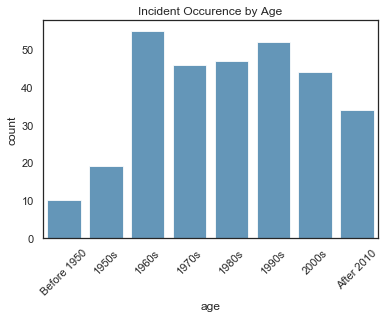

In [843]:
ax = sns.barplot(x = "age", y = "count", data = incidents_byage, 
                 ci=None, color = "#2c7fb8",alpha = 0.8).set_title("Incident Occurence by Age")

plt.xlabel("age")
plt.ylabel("count")
plt.xticks(rotation=45)

plt.show()

Since 1960s, when flying gradually became a popular mode of transportation, the number of incidents has seen a remarkable increase. 

### 3.2.2. "Risky" Airlines

Using `incidents_df2`, we want to understand the “risky” airlines. 

In [659]:
risky_df = incidents_df2[incidents_df2["airline"]!= ""].groupby("airline").size().reset_index(name="count").sort_values("count",ascending=False)

In [658]:
#Let's check the top 10 risky airlines
risky_df.head(10)

,airline,accident_count
10,Aeroflot,15
179,TWA,9
19,Air France,7
88,Eastern Air Lines,6
156,Pan,5
190,United Airlines,5
140,National Airlines,4
185,Turkish Airlines,4
33,American Airlines,4
145,Northwest Airlines,4


It seems that we should be more careful about taking the flights of Aeroflot, TWA (Trans World Airlines) and Air France.

## 3.3. Understanding Flight Delays and Cancellations

Flight delays and cancellations are annoying. We want to find out the airlines with serious delay and cancellation problems and avoid using their service.

In [594]:
delayed_cancelled_df = flights_df2[(flights_df2["arr_delay_new"]>=30) | (flights_df2["cancelled"]==1)].groupby("carrier").size().reset_index(name="count").sort_values("count",ascending=False)

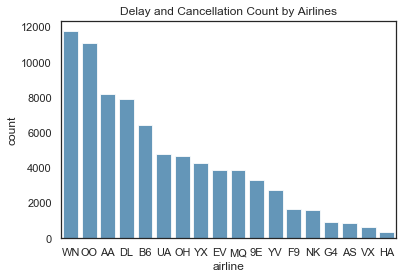

In [596]:
ax = sns.barplot(x = "carrier", y = "count", data = delayed_cancelled_df, 
                 ci = None, color = "#2c7fb8",alpha = 0.8).set_title("Delay and Cancellation Count by Airlines")

plt.xlabel("airline")
plt.ylabel("count")

plt.show()

Now, we have the delays and cancellations of all airlines. However, we don't know the name of the airlines, and that's why we should move to the next part. 

# 4. Combining Dataframes

In this part, we want to combine information about airlines from both sources, `risky_df` (pulled from `incidents_df2`) and `delayed_cancelled_df` (pulled from `flights_df2`) to calculate the “very bad” airlines.  These are airlines that are both “risky” and which are “bad flights.” 

Unfortunately, `incidents_df2` uses the *names* of airlines whereas `flights_df2` uses *IATA codes*.  However, the dataset `airlines_df2` contains a correspondence between airline names and IATA codes which can be used to "translate" the airport IATA codes in `flights_df2` to airline names. 

Although it may be clear sometimes which columns match between the two DataFrames, in general the number of columns (schemas) may be very large in datasets so it is not always obvious.  It is therefore helpfult to develop **schema matching** techniques to help discover these correspondences. 

We will use a very simple technique here to find what columns relate between `airlines_df2` and `flights_df2`, and then use this to combine `risky_df` and `delayed_cancelled_df`.

## 4.1. Relating Airlines and Flights: Schema Matching

Let's start by detecting what fields (columns) “match” between the `airlines_df2` and `flights_df2` DataFrames.  

To do this, let’s note that we only care about the “categorical” (string-valued) columns.  What we want is, e.g., to find fields that have lots of common values (for instance, airline abbreviations or airport codes).  To measure this in a principled way, we can use a measure called the Jaccard distance (or Jaccard similarity).  The Jaccard distance measures similarity between two sets A and B, and is merely:

\begin{equation*}
| A \cap B | / |A \cup B|
\end{equation*}

Let’s compute the Jaccard distances between (the values of) all pairs of attributes in `airlines_df2` and `flights_df2`. This will tell us which attributes include similar values - and thus which might represent the same concept. 

### 4.1.1 Column / Schema Matches

First, we can create a cell with an algorithm that iterates over all `airlines_df2` keys (columns) and all `flights_df2` keys. We can create a nested map of: 

$${r → {p → distance}}$$

We store the Jaccard distance between the values in routes column $r$ to the values in performance column $p$ (only for non-numeric columns). 

In [606]:
# Calculate jaccard similarity
def cal_jaccard(set1, set2):
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection/union

In [633]:
flights_columns = flights_df2.select_dtypes(include = ['object']).columns.values
routes_columns = routes_df2.select_dtypes(include = ['object']).columns.values

In [634]:
flights_columns

array(['carrier', 'origin', 'dest'], dtype=object)

In [635]:
routes_columns

array(['airline_iata_icao', 'airline_id', 'origin', 'origin_id', 'dest',
       'dest_id', 'code_share', 'equipment'], dtype=object)

In [636]:
similar_col = {}

In [865]:
for col1 in routes_columns:
    col_jacdis = {}
    for col2 in flights_columns:
        set1 = set(routes_df2[col1].unique())
        set2 = set(flights_df2[col2].unique())
        jac_dis = cal_jaccard(set1,set2)
        if jac_dis>0:
            col_jacdis[col2] = jac_dis
    similar_col[col1] = col_jacdis 

In [866]:
similar_col

{'airline_iata_icao': {'carrier': 0.020905923344947737},
 'airline_id': {},
 'origin': {'origin': 0.09540532630962834, 'dest': 0.09540532630962834},
 'origin_id': {},
 'dest': {'origin': 0.09547445255474453, 'dest': 0.09547445255474453},
 'dest_id': {},
 'code_share': {},
 'equipment': {'origin': 0.0004675081813931744, 'dest': 0.0004675081813931744}}

### 4.1.2. Matching columns

The above map can help us decide which column in `airlines_df2` is the best match for `carrier` in `flights_df2`.

Note that the **origin** and **dest** codes also have a match which doesn't make much sense; they are 3-letter **airport** codes rather than a 3-letter **airline** codes.  So, in this case, we will just care about the match for `carrier`.  

Recall what `airlines_df2` looks like:

In [632]:
airlines_df2.head()

,airline_id,airline_name,airline_alias,airline_iata,airline_icao,airline_callsign,airline_country,active
0,1,Private flight,,-,,,,Y
1,2,135 Airways,,,GNL,GENERAL,United States,N
2,3,1Time Airline,,1T,RNX,NEXTIME,South Africa,Y
3,4,2 Sqn No 1 Elementary Flying Training School,,,WYT,,United Kingdom,N
4,5,213 Flight Unit,,,TFU,,Russia,N


Here, we would like to use **airline_iata** and **airline_icao** in `airlines_df2` to match **airline_iata_icao** in `routes_df2`, and **carrier** in `flights_df2`. Next, let's match.

In [ ]:
# update the dictionary to include the name of the attribute in airports_df that corresponds to carrier.
mapping = {'carrier': "airline_iata","airline_icao"}

## 4.2.  Joining DataFrames

Now we know how `airlines_df2` and `flights_df2` relate, so we can use this to add the names of airlines to `delayed_cancelled_df`. 

In [646]:
delayed_cancelled_df.head()

,carrier,count
15,WN,11762
12,OO,11093
1,AA,8186
4,DL,7910
3,B6,6447


In [650]:
delayed_cancelled_df.carrier.unique()

array(['WN', 'OO', 'AA', 'DL', 'B6', 'UA', 'OH', 'YX', 'EV', 'MQ', '9E',
       'YV', 'F9', 'NK', 'G4', 'AS', 'VX', 'HA'], dtype=object)

In [709]:
delayed_cancelled_ext_df = pd.merge(delayed_cancelled_df, airlines_df2, how = "inner", left_on = "carrier", right_on = "airline_iata")

Now, we can see the airlines with most delays and cancellations.

In [710]:
delayed_cancelled_ext_df[["airline_name","carrier","count"]].head(10)

,airline_name,carrier,count
0,Southwest Airlines,WN,11762
1,SkyWest,OO,11093
2,American Airlines,AA,8186
3,Delta Air Lines,DL,7910
4,JetBlue Airways,B6,6447
5,United Airlines,UA,4778
6,Comair,OH,4657
7,Midwest Airlines,YX,4303
8,Atlantic Southeast Airlines,EV,3896
9,American Eagle Airlines,MQ,3870


## 4.3 Calculate "Very Bad" Airlines

Now, we want to calculate the “very bad” airlines, i.e. those that are in both `risky_df` and `delayed_cancelled_ext_df`. 

In [711]:
risky_df.columns.values[-1] = "accident_count"
delayed_cancelled_ext_df = delayed_cancelled_ext_df.rename(columns = {"count":"dc_count"})

In [712]:
delayed_cancelled_ext_df.head()

,carrier,dc_count,airline_id,airline_name,airline_alias,airline_iata,airline_icao,airline_callsign,airline_country,active
0,WN,11762,4547,Southwest Airlines,,WN,SWA,SOUTHWEST,United States,Y
1,OO,11093,4738,SkyWest,,OO,SKW,SKYWEST,United States,Y
2,AA,8186,24,American Airlines,,AA,AAL,AMERICAN,United States,Y
3,DL,7910,2009,Delta Air Lines,,DL,DAL,DELTA,United States,Y
4,B6,6447,3029,JetBlue Airways,,B6,JBU,JETBLUE,United States,Y


In [727]:
very_bad_df = pd.merge(risky_df, delayed_cancelled_ext_df[["airline_name","carrier","dc_count"]], left_on = "airline", right_on = "airline_name", how = "inner" )

In [728]:
print("There are", str(len(very_bad_df)), "very bad airlines")

There are 7 very bad airlines


In [729]:
very_bad_df

,airline,accident_count,airline_name,carrier,dc_count
0,United Airlines,5,United Airlines,UA,4778
1,American Airlines,4,American Airlines,AA,8186
2,Southwest Airlines,3,Southwest Airlines,WN,11762
3,Delta Air Lines,3,Delta Air Lines,DL,7910
4,Atlantic Southeast Airlines,2,Atlantic Southeast Airlines,EV,3896
5,Alaska Airlines,1,Alaska Airlines,AS,894
6,Comair,1,Comair,OH,4657


Now, we are safe to add these airlines to the blacklist, and think over the alternatives if we want to take their flights.

# 5. Work with a Larger Dataset

The above sections give us a glance at the flight data. But that's only a small dataset. We want to explore a larger dataset.

## 5.1.  Pulling data from the web

Now we will go beyond the 1 month’s data that currently exists, instead expanding to 3 months’ flight data.  Here we'll be looking at older, archival data instead of Jan 2018 data. Let's pull the flight data for 2016 (August to October).


In [4]:
import requests
from io import StringIO

In [243]:
aug_flights_df = requests.get('http://big.dataanalytics.education/data/Flights-Aug-2016.csv').content
sep_flights_df = requests.get('http://big.dataanalytics.education/data/Flights-Sep-2016.csv').content
oct_flights_df = requests.get('http://big.dataanalytics.education/data/Flights-Oct-2016.csv').content

In [249]:
aug_flights_df = pd.read_csv(StringIO(aug_flights_df.decode('utf-8'))).iloc[:,:-1]
sep_flights_df = pd.read_csv(StringIO(sep_flights_df.decode('utf-8'))).iloc[:,:-1]
oct_flights_df = pd.read_csv(StringIO(oct_flights_df.decode('utf-8'))).iloc[:,:-1]

In [250]:
aug_flights_df.to_sql('flights', engine, if_exists='replace',index = False) 
sep_flights_df.to_sql('flights', engine, if_exists='append',index = False) 
oct_flights_df.to_sql('flights', engine, if_exists='append',index = False) 

Have a look at the dataset.

In [5]:
flight_prefix_df = pd.read_sql_query('select * from flights LIMIT 10',con=engine)

In [6]:
flight_prefix_df.head()

,Year,Month,DayofMonth,Carrier,FlightNum,Origin,OriginCity,OriginState,Dest,DestCity,DestState,DepTime,ArrTime,ArrDelayMinutes,Cancelled
0,2016,8,1,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,557.0,711.0,0.0,0.0
1,2016,8,2,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,558.0,704.0,0.0,0.0
2,2016,8,3,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,552.0,704.0,0.0,0.0
3,2016,8,4,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,839.0,1003.0,172.0,0.0
4,2016,8,5,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,619.0,721.0,10.0,0.0


## 5.2. Query via SQL

In this part, we will see how to speed up queries using indexing. We will start by seeing that the flights table is extremely large by counting the number of rows in the table. Let's see how many records in the dataset.

In [7]:
count_df = pd.read_sql_query("select count(*) from flights",con=engine)

In [8]:
print("There are", str(count_df.iloc[0][0]),"flights which originate in Philadelphia")

There are 1425851 flights which originate in Philadelphia


### 5.2.1. A simple SQL query

Do a simple SQL query to check how many flights originate in Philadelphia. 

In [9]:
flight_from_phl_count_df = pd.read_sql_query("SELECT count(*) FROM flights WHERE Origin = 'PHL'",con = engine)

In [50]:
print("There are", str(flight_from_phl_count_df.iloc[0][0]),"flights which originate in Philadelphia.")

There are 18681 flights which originate in Philadelphia.


Run the above query 100 times and measure the execution time to see how fast the query is.

In [11]:
import timeit
import time
start = timeit.default_timer()

for i in range(0, 100):
    flight_from_phl_count_df = pd.read_sql_query("SELECT count(*) FROM flights WHERE Origin = 'PHL'",con = engine)
end = timeit.default_timer()
exec_time = end-start
print('Execution time: ', exec_time)

Execution time:  25.578097563


### 5.2.2. Using an Index to Improve Performance## 
Now we want to measure how indexing speeds up query execution. In the next cell, we make a copy of the 'flights' table in a new table called 'flights_copy' and create index for the table.

In [14]:
c = engine.cursor() # The database will be saved in the location where your 'py' file is saved

c.execute("CREATE TABLE flights_copy AS SELECT * FROM flights")

In [15]:
flight_copy_prefix_df = pd.read_sql_query('select * from flights_copy LIMIT 10',con=engine)

In [16]:
flight_copy_prefix_df.head()

,Year,Month,DayofMonth,Carrier,FlightNum,Origin,OriginCity,OriginState,Dest,DestCity,DestState,DepTime,ArrTime,ArrDelayMinutes,Cancelled
0,2016,8,1,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,557.0,711.0,0.0,0.0
1,2016,8,2,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,558.0,704.0,0.0,0.0
2,2016,8,3,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,552.0,704.0,0.0,0.0
3,2016,8,4,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,839.0,1003.0,172.0,0.0
4,2016,8,5,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,619.0,721.0,10.0,0.0


In [17]:
colname = flight_copy_prefix_df.columns.values

In [18]:
colname

array(['Year', 'Month', 'DayofMonth', 'Carrier', 'FlightNum', 'Origin',
       'OriginCity', 'OriginState', 'Dest', 'DestCity', 'DestState',
       'DepTime', 'ArrTime', 'ArrDelayMinutes', 'Cancelled'], dtype=object)

In [19]:
for i in colname:
    index = i + "_index"
    engine.execute("CREATE INDEX " + index + " ON flights_copy(" + i + ")")

In [20]:
flight_copy_prefix_df = pd.read_sql_query('select * from flights_copy LIMIT 10',con=engine)
flight_copy_prefix_df.head()

,Year,Month,DayofMonth,Carrier,FlightNum,Origin,OriginCity,OriginState,Dest,DestCity,DestState,DepTime,ArrTime,ArrDelayMinutes,Cancelled
0,2016,8,1,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,557.0,711.0,0.0,0.0
1,2016,8,2,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,558.0,704.0,0.0,0.0
2,2016,8,3,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,552.0,704.0,0.0,0.0
3,2016,8,4,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,839.0,1003.0,172.0,0.0
4,2016,8,5,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,619.0,721.0,10.0,0.0


In [21]:
start = timeit.default_timer()

for i in range(0, 100):
    flight_copy_from_phl_count_df = pd.read_sql_query("SELECT count(*) FROM flights_copy WHERE Origin = 'PHL'",con = engine)
end = timeit.default_timer()
exec_time = end-start
print('Execution time: ', exec_time)

Execution time:  0.24861944200000607


It is much more faster!

## 5.3 GROUP BY-HAVING SQL Queries

We will now revisit the question of delayed-cancelled airlines from the previous analysis, and explore the correspondence between DataFrame and SQL abstractions. 

### 5.3.1. Delayed-Cancelled airlines
We'll start with a simple SELECT-FROM-WHERE SQL query which extracts from flights all those 
which were delayed by 30 min or more or which were cancelled. 

In [22]:
delayed_cancelled_df = pd.read_sql("SELECT * FROM flights_copy WHERE \
                                    ArrDelayMinutes>=30 OR Cancelled =1", con=engine)

In [23]:
delayed_cancelled_df.head()

,Year,Month,DayofMonth,Carrier,FlightNum,Origin,OriginCity,OriginState,Dest,DestCity,DestState,DepTime,ArrTime,ArrDelayMinutes,Cancelled
0,2016,8,15,AA,16,SFO,"San Francisco, CA",California,JFK,"New York, NY",New York,1252.0,2152.0,30.0,0.0
1,2016,8,26,AA,21,JFK,"New York, NY",New York,LAX,"Los Angeles, CA",California,1857.0,2247.0,30.0,0.0
2,2016,8,17,AA,37,DFW,"Dallas/Fort Worth, TX",Texas,SFO,"San Francisco, CA",California,1747.0,1913.0,30.0,0.0
3,2016,8,20,AA,162,HNL,"Honolulu, HI",Hawaii,LAX,"Los Angeles, CA",California,1308.0,2215.0,30.0,0.0
4,2016,8,22,AA,178,MCO,"Orlando, FL",Florida,LAX,"Los Angeles, CA",California,1938.0,2205.0,30.0,0.0


### 5.3.2. Frequently Delayed-Cancelled Airlines 

We now want to calculate the airlines that are *frequently* cancelled or delayed by more than 30 minutes, i.e. those for which there are more than 500 occurrences in the flight dataset.  We'll start by doing this using DataFrames, and then move to SQL.

In [24]:
frequent_dc_airlines_df = delayed_cancelled_df.groupby("Carrier").size().reset_index(name = "count").query("count>500").sort_values("count",ascending = True)

In [25]:
frequent_dc_airlines_df.head()

,Carrier,count
6,HA,568
10,VX,2450
1,AS,2645
7,NK,4849
5,F9,4913


Now we want to write this query using SQL.

In [26]:
frequent_dc_airlines_sql = pd.read_sql("SELECT Carrier, count(Carrier) AS count FROM \
                                        (SELECT * FROM flights_copy\
                                        WHERE ArrDelayMinutes>=30 OR Cancelled =1)\
                                        GROUP BY Carrier HAVING count>500\
                                        ORDER BY count",con = engine)

In [27]:
frequent_dc_airlines_sql.head()

,Carrier,count
0,HA,568
1,VX,2450
2,AS,2645
3,NK,4849
4,F9,4913


## 5.4 Getting from PHL to LAX

Our last step will be to perform a path computation using SQL.  To make this computation easier, we will start by converting arrival and departure times to minutes since midnight, and will focus on the first 7 days of August. Later, we will look at the complete dataset and see how to make the query over the complete dataset more efficient.

In [28]:
flights_minutes_df = pd.read_sql("SELECT *, (60*(ArrTimeInt - ArrTimeInt%100)/100 + ArrTimeInt%100) AS ArrTimeMinutes,\
                                 (60*(DepTimeInt - DepTimeInt%100)/100 + DepTimeInt%100) AS DepTimeMinutes FROM\
                                 (SELECT *, cast(ArrTime as integer) AS ArrTimeInt, cast(DepTime as integer) AS DepTimeInt\
                                  FROM flights_copy WHERE\
                                  ArrTime is not null AND DepTime is not null)", con = engine)


In [29]:
flights_minutes_df.head()

,Year,Month,DayofMonth,Carrier,FlightNum,Origin,OriginCity,OriginState,Dest,DestCity,DestState,DepTime,ArrTime,ArrDelayMinutes,Cancelled,ArrTimeInt,DepTimeInt,ArrTimeMinutes,DepTimeMinutes
0,2016,8,1,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,557.0,711.0,0.0,0.0,711,557,431,357
1,2016,8,2,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,558.0,704.0,0.0,0.0,704,558,424,358
2,2016,8,3,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,552.0,704.0,0.0,0.0,704,552,424,352
3,2016,8,4,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,839.0,1003.0,172.0,0.0,1003,839,603,519
4,2016,8,5,AA,1,BOS,"Boston, MA",Massachusetts,JFK,"New York, NY",New York,619.0,721.0,10.0,0.0,721,619,441,379


In [30]:
flights_minutes_df.to_sql("flights_min", if_exists = "replace", con = engine)

We would now like to find all flights from PHL to LAX with either zero or one connections, where the connection time is between 1 and 3 hours (60 to 180 minutes).  Start by writing an SQL query to find all direct flights between PHL and LAX in `flights_min`.

In [42]:
direct_df = pd.read_sql("SELECT Year, Month, DayofMonth, Carrier, DepTime, ArrTime FROM flights_min\
                            WHERE Origin = 'PHL' AND Dest = 'LAX'", con = engine)

In [43]:
direct_df.head()

,Year,Month,DayofMonth,Carrier,DepTime,ArrTime
0,2016,8,1,AA,950.0,1339.0
1,2016,8,1,AA,1604.0,1906.0
2,2016,8,1,AA,2042.0,2346.0
3,2016,8,1,AA,741.0,1045.0
4,2016,8,1,AA,1800.0,2029.0


In [38]:
print("There are", str(len(direct_df)),"direct flights from PHL to LAX.")

There are 571 flights from PHL to LAX.


Now we will use SQL to calculate flights from PHL to LAX with one connection, where the connection time is between 1 and 3 hours (60 to 180 minutes, on the same year, month and day).

In [45]:
connection_df = pd.read_sql("SELECT fm1.Year AS Year, fm1.Month AS Month, fm1.DayofMonth AS DayofMonth, \
                            fm1.Dest AS Connection, fm1.Carrier AS Carrier1, fm1.DepTime as DepTime, \
                            fm2.Carrier AS Carrier2, fm2.ArrTime AS ArrTime FROM\
                            flights_min fm1 JOIN flights_min fm2 ON fm1.Dest = fm2.Origin AND\
                            fm1.Year = fm2.Year AND fm1. Month = fm2.Month AND fm1.DayofMonth = fm2.DayofMonth\
                            WHERE fm1.Origin = 'PHL' AND fm2.Dest = 'LAX' AND\
                            fm2.DepTime - fm1.ArrTime >= 60 AND fm2.DepTime - fm1.ArrTime <= 180", con = engine)

In [46]:
connection_df.head()

,Year,Month,DayofMonth,Connection,Carrier1,DepTime,Carrier2,ArrTime
0,2016,8,6,DFW,AA,457.0,AA,918.0
1,2016,8,6,DFW,AA,457.0,AA,1017.0
2,2016,8,7,DFW,AA,502.0,AA,924.0
3,2016,8,21,DFW,AA,458.0,AA,925.0
4,2016,8,21,DFW,AA,458.0,AA,1111.0


In [47]:
print("There are", str(len(connection_df)),"flights from PHL to LAX with one connection and the connection time is between 1 hour and 3 hours.")

There are 14847 flights from PHL to LAX with one connection and the connection time is between 1 hour and 3 hours.


Finally, we want to combine the SQL queries for direct and connection flights, using the same fields. So, we would like to use `Carrier1` as `Carrier` in the connection query.

In [51]:
output_df = pd.read_sql("SELECT Year, Month, DayofMonth, Carrier, DepTime, ArrTime FROM flights_min\
                            WHERE Origin = 'PHL' AND Dest = 'LAX' UNION SELECT fm1.Year AS Year, \
                            fm1.Month AS Month, fm1.DayofMonth AS DayofMonth, fm1.Carrier AS Carrier, \
                            fm1.DepTime as DepTime, fm2.ArrTime AS ArrTime FROM flights_min fm1 JOIN \
                            flights_min fm2 ON fm1.Dest = fm2.Origin AND\
                            fm1.Year = fm2.Year AND fm1. Month = fm2.Month AND fm1.DayofMonth = fm2.DayofMonth\
                            WHERE fm1.Origin = 'PHL' AND fm2.Dest = 'LAX' AND\
                            fm2.DepTime - fm1.ArrTime >= 60 AND fm2.DepTime - fm1.ArrTime <= 180", con = engine)

In [52]:
output_df.head()

,Year,Month,DayofMonth,Carrier,DepTime,ArrTime
0,2016,8,1,AA,554.0,1142.0
1,2016,8,1,AA,557.0,1113.0
2,2016,8,1,AA,557.0,1126.0
3,2016,8,1,AA,617.0,1058.0
4,2016,8,1,AA,630.0,1137.0


Now, we've already done all analysis!